# Perform Exploratory Data Analysis (EDA) on the Taxonomy Structure

## Subtasks:

1. **Compare the publications that generated the scientific summaries with the L3 and L4 Names (per L3, L4):**
    - For each Level 4 (L4) and Level 3 (L3) publication, check if the publications that were used to generate the scientific summary are similar to the L3 and L4 name.
    - For the cases that the answer is no, this means that the classification step failed for any reason and we must investigate why. For example, we can search their pub_venue, ref_venues and cit_venues in the venue_graph (it is hosted on HF) and check with which L3 and L4 are linked.

2. **Statistics on related/not-related category/subcategory:**
    - The results of the **validate.py script under the pipeline folder are logged into Langfuse**. Based on the results logged, we can calculate some statistics. We have the following candidate results for each pair (L3-L4 and L4-L5) logged into Langfuse:

        Related: True | Subcategory: True

        Related: True | Subcategory: False

        Related: False | Subcategory: False
        
    - In essence, our task is to fill the missing values in the two following tables:
    
        | Case   | Related | Subcategory | Statistics |
        |--------|---------|-------------|------------|
        | L3-L4  | T       | T           |    TBF     |
        | L3-L4  | T       | F           |    TBF     |
        | L3-L4  | F       | F           |    TBF     |
        |--------|---------|-------------|------------|
        | L4-L5  | T       | T           |    TBF     |
        | L4-L5  | T       | F           |    TBF     |
        | L4-L5  | F       | F           |    TBF     |
        |--------|---------|-------------|------------|
        
        <hr style="width:50%;text-align:left;margin-left:0">

        | Case   | L3-L4 Related | L3-L4 Subcategory | L4-L5 Related | L4-L5 Subcategory | Statistics |
        |--------|---------------|-------------------|---------------|-------------------|------------|
        | Case 1 | T             | T                 | T             | T                 | TBF        |
        | Case 2 | T             | T                 | T             | F                 | TBF        |
        | Case 3 | T             | T                 | F             | F                 | TBF        |
        | Case 4 | T             | F                 | T             | T                 | TBF        |
        | Case 5 | T             | F                 | T             | F                 | TBF        |
        | Case 6 | T             | F                 | F             | F                 | TBF        |
        | Case 7 | F             | F                 | T             | T                 | TBF        |
        | Case 8 | F             | F                 | T             | F                 | TBF        |
        | Case 9 | F             | F                 | F             | F                 | TBF        |

# General Imports - Global Vars - Util Functions

In [1]:
# general imports
import json
import os
import sys
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import httpx

from tqdm import tqdm
from adjustText import adjust_text
from dotenv import load_dotenv
from langfuse import Langfuse
from langfuse.api.resources.commons.errors.unauthorized_error import UnauthorizedError
from collections import Counter

# haystack
from haystack import Pipeline
from haystack.utils import Secret
from haystack.components.builders import PromptBuilder

# The classic module imports do not work, because the notebook cell does not execute as a module.
# so we use sys.path.appends.
sys.path.append(os.path.abspath(os.pardir))

# local imports
from utils.generators import StructuredOllamaGenerator, StructuredOpenAIGenerator
from utils.venue_parser import VenueParser
from utils.multigraph import MultiGraph
from pipeline.metrics import trace_pagination


# env variables
load_dotenv("../data/validation_envs.env", verbose=True) # this is not commited to the repo
DATA_PATH = "../data"
INFERENCE_GRAPH_NAME = "scinobo_inference_graph.json"
FOS_TAXONOMY_PATH = os.getenv("FOS_TAXONOMY_PATH")
LANGFUSE_HOST = os.getenv("LANGFUSE_HOST")
LANGFUSE_PUBLIC_KEY = os.getenv("LANGFUSE_PUBLIC_KEY")
LANGFUSE_SECRET_KEY = os.getenv("LANGFUSE_SECRET_KEY")
OPENAI_API_KEY = os.getenv("OPENAI_API_KEY")
OLLAMA_HOST = os.getenv("OLLAMA_HOST")
OLLAMA_PORT = os.getenv("OLLAMA_PORT")
MODEL_NAME = os.getenv("MODEL_NAME")
DOIMODE_URL = os.getenv("DOIMODE_URL")
LANGFUSE_URER_ID_VAR = os.getenv("LANGFUSE_URER_ID_VAR")
LANGFUSE_TAG_VAR = os.getenv("LANGFUSE_TAG_VAR")


# set_langfuse
def set_langfuse():
    try:
        langfuse = Langfuse() # no need to pass the host, port, public key, and secret key since they are already set in the config
        langfuse.auth_check()
    except UnauthorizedError:
        print(
            "Langfuse credentials incorrect. Please re-enter your Langfuse credentials in the pipeline settings."
        )
    except Exception as e:
        print(f"Langfuse error: {e} Please re-enter your Langfuse credentials in the pipeline settings.")
    return langfuse

# init doimode client
headers = {
    "Content-Type": "application/json"
}
doimode = httpx.Client(
    base_url=DOIMODE_URL,
    headers=headers,
    timeout=60,
)

/usr/local/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# paths & dir setup & vars
PUBLICATIONS_DESC_L3_L4 = os.path.join(DATA_PATH, "descriptions", "publications-l3-l4-211124.json")
PUBLICATIONS_DESC_L5 = os.path.join(DATA_PATH, "descriptions", "publications-l5-191224.json")
SCI_DESC_L3_L4 = os.path.join(DATA_PATH, "descriptions", "sci-descriptions-l3-l4-101224.json")
SCI_DESC_L5 = os.path.join(DATA_PATH, "descriptions", "sci-descriptions-l5-191224.json")
PROMPT_NAME = "prompt-template-summary-pubs-ver"
PROMPT_NAME_CIT_DATA = "prompt-template-pubs-ver-cit-data"

In [3]:
# load everything
with open(FOS_TAXONOMY_PATH, "r") as f:
    fos_taxonomy = json.load(f)

with open(PUBLICATIONS_DESC_L3_L4, "r") as f:
    publications_desc_l3_l4 = json.load(f)

with open(PUBLICATIONS_DESC_L5, "r") as f:
    publications_desc_l5 = json.load(f)

with open(SCI_DESC_L3_L4, "r") as f:
    sci_desc_l3_l4 = json.load(f)

with open(SCI_DESC_L5, "r") as f:
    sci_desc_l5 = json.load(f)

In [4]:
# the graph has the L4s in IDs, so we must create a dict from the IDs to the names.
l4_mappings = {item["level_4_id"]: item["level_4"] for item in fos_taxonomy}

In [5]:
# init llm
def init_llm():
    # FOR USING QWEN2.5
    if MODEL_NAME == "qwen2.5:32b":
        llm = StructuredOllamaGenerator(
            model=MODEL_NAME, 
            url=f"http://{OLLAMA_HOST}:{OLLAMA_PORT}", 
            generation_kwargs={
                "num_ctx": 8192, 
                "temperature": 0.0
            },
            format= {
                "type": "object",
                "properties": {
                    "related/similar": {
                        "type": "string"
                    },
                    "not similar/related": {
                        "type": "string"
                    }
                },
                "required": [
                    "related/similar",
                    "not similar/related"
                ]
            }
        )
    else:
        # FOR USING GPT-4o
        llm = StructuredOpenAIGenerator(
            api_key=Secret.from_token(OPENAI_API_KEY), 
            model="gpt-4o-2024-08-06",
            generation_kwargs={
                "temperature": 0.0
            },
            response_format={
                "type": "json_schema",
                "json_schema": {
                    "name": "fos_reasoning",
                    "schema": {
                        "type": "object",
                        "properties": {
                            "related/similar": {
                                "type": "string"
                            },
                            "not similar/related": {
                                "type": "string"
                            }
                        },
                        "required": [
                            "related/similar",
                            "not similar/related"
                        ],
                        "additionalProperties": False
                    },
                    "strict": True
                }
            }
        )
    return llm


# convert the taxonomy to a L4-L5 dict for later on
def convert_taxonomy_to_l4_l5_dict(taxonomy):
    l4_l5_dict = {}
    for item in taxonomy:
        if item["level_4"] not in l4_l5_dict:
            l4_l5_dict[item["level_4"]] = set()
        l4_l5_dict[item["level_4"]].add(item["level_5_name"])
    return l4_l5_dict


def download_venue_graph():
    # download the venue graph from huggingface - use wget because we want it as a json file on disk
    os.system(f"wget https://huggingface.co/datasets/iNoBo/scinobo-fos-inference-graph/resolve/main/scinobo_inference_graph.json?download=true -O {DATA_PATH}/{INFERENCE_GRAPH_NAME}")

# Case 1:

### Compare the publications that generated the scientific summaries with the L3 and L4 Names (per L3, L4)
- For each Level 3 and Level 4, we retrieved the top-10 classified publications based on the classification score.
- Given the title and the abstract of these publications, we provided them to a Llama3.2-3b model, to provide a scientific summary.
- However, we noticed upon inspection that some publications were completely irrelevant with the resulting scientific summary or with the name of the FoS. The scientific summary however, is correct because the LLM ignored the irrelevant publications.
- We will test the publications against the FoS names rather the scientific summaries, because when the title and the abstracts are present then the LLM that creates the summary makes use of them in the description, hence the comparison is biased.

## Case 1 - Init Haystack Pipelines

In [6]:
# prompt
# init langfuse
langfuse = set_langfuse()
prompt_template = langfuse.get_prompt(name=PROMPT_NAME)
prompt_template_cit_data = langfuse.get_prompt(name=PROMPT_NAME_CIT_DATA)
# haystack pipeline for comparing summaries with publications
# initialize the components

# NOTE: We will use the OpenAI API for the language model, in this EDA notebook. Some publications lack their abstracts and we noticed that GPT4 is better 
# at reasoning when only prompted with the title

# get the prompt from langfuse
prompt_builder = PromptBuilder(template=prompt_template.prompt)
prompt_builder_cit_data = PromptBuilder(template=prompt_template_cit_data.prompt)
# create the pipeline - original experiment
pipe = Pipeline()
pipe.add_component(instance=init_llm(), name="llm")
pipe.add_component(instance=prompt_builder, name="prompt_builder")
pipe.connect("prompt_builder", "llm")
pipe.draw(os.path.join(DATA_PATH, "haystack-pipelines", "taxonomy-eda-sums-pubs-ver-l3-l4-090125.png"))
# create a new pipeline - cit data experiment
pipe_cit_data = Pipeline()
pipe_cit_data.add_component(instance=init_llm(), name="llm_cit_data")
pipe_cit_data.add_component(instance=prompt_builder_cit_data, name="prompt_builder_cit_data")
pipe_cit_data.connect("prompt_builder_cit_data", "llm_cit_data")
pipe_cit_data.draw(os.path.join(DATA_PATH, "haystack-pipelines", "taxonomy-eda-pubs-ver-cit-data-l3-l4-090125.png"))

## Case 1 - Util Functions

In [7]:
def run_case_1_pipeline(level_names, input_data, score_key):
    results = dict()
    for level in tqdm(level_names, desc="Validating the FoS names with the publications"):
        # get the publications
        publications = input_data[level]["publications"] if level in input_data else None
        if publications:
            # run the pipeline
            for pub in publications:
                # get the title and the abstract
                title, abstract = pub["title"], pub["paperAbstract"]
                # run the pipeline
                res = pipe.run(
                    {
                        "prompt_builder": {
                            "description": level,
                            "title": title.lower().rstrip().lstrip() if title is not None else "",
                            "abstract": abstract.lower().rstrip().lstrip() if abstract is not None else ""
                        }
                    }
                )
                res = json.loads(res['llm']['replies'][0])
                if level not in results:
                    results[level] = list()
                results[level].append(
                    {
                        "title": title,
                        "abstract": abstract,
                        "doi": pub["doi"],
                        score_key: pub[score_key],
                        "journal_name": pub["journalName"],
                        "venue": pub["venue"],
                        "related": res["related/similar"],
                        "not_related": res["not similar/related"]
                    }
                )
        else:
            print(f"No publications found for {level}")
    return results


def run_case_1_cit_data_pipeline(input_data, score_key):
    results = dict()
    for level, publications in tqdm(input_data.items(), desc="Validating the FoS names with the publications using citation data"):
        # get the publications
        if publications:
            # run the pipeline
            for pub in publications:
                # get the title and the abstract
                title, abstract, doi = pub["title"], pub["abstract"], pub["doi"]
                if doi is not None:
                    doimode_res = doimode.get(f"/fos/doimode/{doi}")
                    if doimode_res.status_code == 200 and "message" not in doimode_res.json():
                        doimode_res = doimode_res.json()
                        publication_venue = doimode_res["pub_venue"] if doimode_res["pub_venue"] is not None and doimode_res["pub_venue"] != "" else pub["journal_name"]
                        citation_venues = doimode_res["cit_venues"]
                        reference_venues = doimode_res["ref_venues"]
                    else:
                        publication_venue = pub["venue"] if pub["venue"] is not None and pub["venue"] != "" else pub["journal_name"]
                        citation_venues = []
                        reference_venues = []
                else:
                    publication_venue = pub["venue"] if pub["venue"] is not None and pub["venue"] != "" else pub["journal_name"]
                    citation_venues = []
                    reference_venues = []
                # run the pipeline
                res = pipe_cit_data.run(
                    {
                        "prompt_builder_cit_data": {
                            "description": level,
                            "title": title.lower().rstrip().lstrip() if title is not None else "",
                            "abstract": abstract.lower().rstrip().lstrip() if abstract is not None else "",
                            "published_venue": publication_venue,
                            "citation_venues": "\n".join(citation_venues),
                            "reference_venues": reference_venues
                        }
                    }
                )
                res = json.loads(res['llm_cit_data']['replies'][0])
                if level not in results:
                    results[level] = list()
                results[level].append(
                    {
                        "title": title,
                        "abstract": abstract,
                        "doi": doi,
                        score_key: pub[score_key],
                        "journal_name": pub["journal_name"],
                        "venue": pub["venue"],
                        "citation_venues": citation_venues,
                        "reference_venues": reference_venues,
                        "related": res["related/similar"],
                        "not_related": res["not similar/related"]
                    }
                )
        else:
            print(f"No publications found for {level}")
    return results

In [8]:
def calc_metrics_case_1(level_results):
    my_metrics = dict()
    for level in level_results:
        my_metrics[level] = {
            "related": 0,
            "not_related": 0,
            "total_evaluated": 0
        }
        for pub in level_results[level]:
            if pub["title"] is None and pub["abstract"] is None:
                continue
            my_metrics[level]["total_evaluated"] += 1
            if pub["related"] == "Yes":
                my_metrics[level]["related"] += 1
            else:
                my_metrics[level]["not_related"] += 1
    return my_metrics

In [9]:
def run_experiment_no_citation_data(level, filename, science_descriptions, score_key):
    level_fos_names = list(set([fos[level] for fos in fos_taxonomy if fos[level] != "N/A"]))
    if os.path.exists(os.path.join(DATA_PATH, "metrics", filename)):
        with open(os.path.join(DATA_PATH, "metrics", filename), "r") as f:
            level_results = json.load(f)
    else:
        # for every level FoS specified retrieve the scientific description and the publications and run them through the pipeline
        level_results = run_case_1_pipeline(
            level_fos_names, 
            science_descriptions,
            score_key
        )
        # save it under the metrics folder
        with open(os.path.join(DATA_PATH, "metrics", filename), "w") as f:
            json.dump(level_results, f)
    # calculate metrics and plot the yes/no against the level 3 fos names
    # filter out the publications that do not have a title nor an abstract
    level_metrics = calc_metrics_case_1(level_results)
    # convert it to a pandas dataframe and plot it
    level_metrics = pd.DataFrame(level_metrics).T
    print(level_metrics)
    level_metrics["category"] = level_metrics.index
    return level_results, level_metrics


def run_experiment_citation_data(level_results, filename, score_key):
    if os.path.exists(os.path.join(DATA_PATH, "metrics", filename)):
        with open(os.path.join(DATA_PATH, "metrics", filename), "r") as f:
            level_results_cit_data = json.load(f)
    else:
        # for every l3 retrieve the scientific description and the publications and run them through the pipeline
        level_results_cit_data = run_case_1_cit_data_pipeline(level_results, score_key)
        # save it under the metrics folder
        with open(os.path.join(DATA_PATH, "metrics", filename), "w") as f:
            json.dump(level_results_cit_data, f)
    # calculate metrics and plot the yes/no against the level 3 fos names
    # filter out the publications that do not have a title nor an abstract
    level_metrics_cit_data = calc_metrics_case_1(level_results_cit_data)
    # convert it to a pandas dataframe and plot it
    level_metrics_cit_data = pd.DataFrame(level_metrics_cit_data).T
    print(level_metrics_cit_data)
    level_metrics_cit_data["category"] = level_metrics_cit_data.index
    return level_results_cit_data, level_metrics_cit_data


def venue_graph_exploration_publications_df(input_data, score_key, filename):
    level_publications_df = []
    for level, publications in input_data.items():
        for pub in publications:
            # unpack the pub
            title, abstract, doi, score_value, journal_name, venue, citation_venues, reference_venues, related, not_related = pub.values()
            # record
            doc = {
                "level": level,
                "title": title,
                "abstract": abstract,
                "doi": doi,
                score_key: score_value,
                "journal_name": journal_name,
                "venue": venue,
                "related": related,
                "not_related": not_related
            }
            # add empty strings if the citation_venues and reference_venues are empty
            if not citation_venues:
                citation_venues = [""]
            if not reference_venues:
                reference_venues = [""]
            # perform a count on the venues
            citation_venues = Counter(citation_venues)
            reference_venues = Counter(reference_venues)       
            # flatten citation_venues and reference_venues
            for ven, count in citation_venues.most_common():
                level_publications_df.append({**doc, "cit_venue": ven, "count": count if ven !="" else 0, "type": "citation"})
            for ven, count in reference_venues.most_common():
                level_publications_df.append({**doc, "ref_venue": ven, "count": count if ven !="" else 0, "type": "reference"})
    # create the dataframe
    level_publications_df = pd.DataFrame(level_publications_df)
    # save it to excel
    level_publications_df.to_excel(os.path.join(DATA_PATH, "metrics", filename), index=False)
    

def venue_graph_exploration_venues_df(parser, graph, input_data, filename, level_key):
    venues_df = []
    for level, publications in tqdm(input_data.items(), desc="Extracting venue information"):
        for pub in publications:
            # unpack the pub
            _, _, _, _, journal_name, venue, citation_venues, reference_venues, related, not_related = pub.values()
            # get the venues
            venues = citation_venues + reference_venues + [journal_name] + [venue]
            # filter from the list None and empty values
            venues = [ven for ven in venues if ven is not None and ven != ""]
            for my_ven in venues:
                # get the venue information from the graph
                # process the venue
                processed_ven = parser.preprocess_venue(my_ven)[0]
                if processed_ven is None:
                    continue    
                # retrieve all the edges that this venue has with L3
                venue_info = [i for i in graph.edges(data=level_key, nbunch=processed_ven) if i[2]]
                if venue_info:
                    for ven_inf in venue_info:
                        # unpack the venue_info
                        venue_name, connected_fos, edge_score = ven_inf
                        if level_key == "in_L4":
                            connected_fos = l4_mappings.get(connected_fos, "N/A")
                        if connected_fos != level:
                            continue
                        # record
                        doc = {
                            "abbreviated": venue_name,
                            "original_venue_name": my_ven,
                            "edge_score": edge_score,
                            "connected_fos": connected_fos,
                            "related": 1 if related == "Yes" else 0,
                            "not_related": 1 if not_related == "Yes" else 0
                        }
                        venues_df.append(doc)
    # create the dataframe
    venues_df = pd.DataFrame(venues_df)
    # aggregate and sum the related and not related for the rows that have the same: abbreviated, original_venue_name, connected_l3, edge_score
    venues_df = venues_df.groupby(["abbreviated", "original_venue_name", "connected_fos", "edge_score"]).agg({"related": "sum", "not_related": "sum"}).reset_index()
    # save it to excel
    venues_df.to_excel(os.path.join(DATA_PATH, "metrics", filename), index=False)

## Case 1 - Plot Functions

In [10]:
# plot functions for case 1
def plot_pie_chart(df):
    total_related = df["related"].sum()
    total_not_related = df["not_related"].sum()
    plt.pie(
        [total_related, total_not_related],
        labels=["related", "not_related"],
        autopct="%1.1f%%",
        startangle=140,
        wedgeprops={"edgecolor": "black"},
    )
    plt.title("Overall Proportions")
    plt.show()


def group_bar_chart(df, figsize=(64, 64)):
    df.plot(
    x="category",
    y=["related", "not_related"],
    kind="bar",
    figsize=figsize,
    width=0.8,
    )
    plt.title("Grouped Bar Chart: Related vs. Not Related")
    plt.ylabel("Count")
    plt.xlabel("category")
    plt.legend(title="Type")
    plt.tight_layout()
    plt.show()


def proportional_heatmap(df):
    heatmap_data = df[["related", "not_related"]].T
    plt.figure(figsize=(64, 64))
    sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt="d")
    plt.title("Heatmap of Related and Not Related")
    plt.ylabel("Type")
    plt.xlabel("category")
    plt.xticks(ticks=range(len(df)), labels=df["category"], rotation=45, ha="right")
    plt.tight_layout()
    plt.show()


def bubble_chart(df):
    plt.figure(figsize=(64, 64))  # Adjust the figure size as needed
    plt.scatter(
        df["related"],
        df["not_related"],
        s=df["total_evaluated"] * 100,  # Bubble size
        alpha=0.6,
        edgecolors="w",
        linewidth=0.5,
    )
    
    texts = []
    for _, row in df.iterrows():
        texts.append(
            plt.text(
                row["related"],
                row["not_related"],
                row["category"],
                fontsize=9,
                ha="center",
                va="center",
            )
        )
    
    # Adjust text to prevent overlap
    adjust_text(
        texts,
        arrowprops=dict(arrowstyle="->", color="gray", lw=0.5),  # Optional: add arrows
    )
    
    plt.title("Bubble Chart")
    plt.xlabel("related")
    plt.ylabel("not_related")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

## Case 1 - Level 3 Experiments

### Evaluation without Citation data

In [11]:
# FOR THE LEVEL 3
level_3_results, level_3_metrics = run_experiment_no_citation_data(
    level="level_3",
    filename="eda-case-1-l3-100125.json",
    science_descriptions=sci_desc_l3_l4,
    score_key="score_for_L3"
)

                                    related  not_related  total_evaluated
sport sciences                            6            4               10
rehabilitation                            7            1                8
orthopedics                               6            1                7
toxicology                                2            8               10
nuclear medicine & medical imaging        4            5                9
...                                     ...          ...              ...
bioinformatics                            2            6                8
biochemistry & molecular biology          7            1                8
cardiovascular system & hematology        7            2                9
information & library sciences            6            4               10
nanoscience & nanotechnology              5            5               10

[174 rows x 3 columns]


#### Pie chart

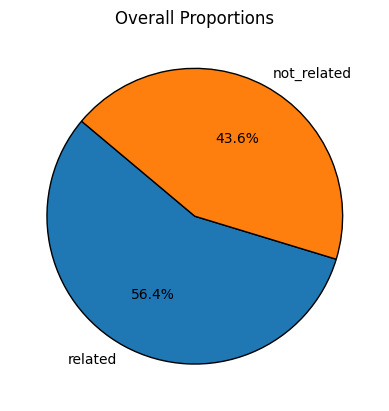

In [12]:
plot_pie_chart(level_3_metrics)

#### Group bar chart

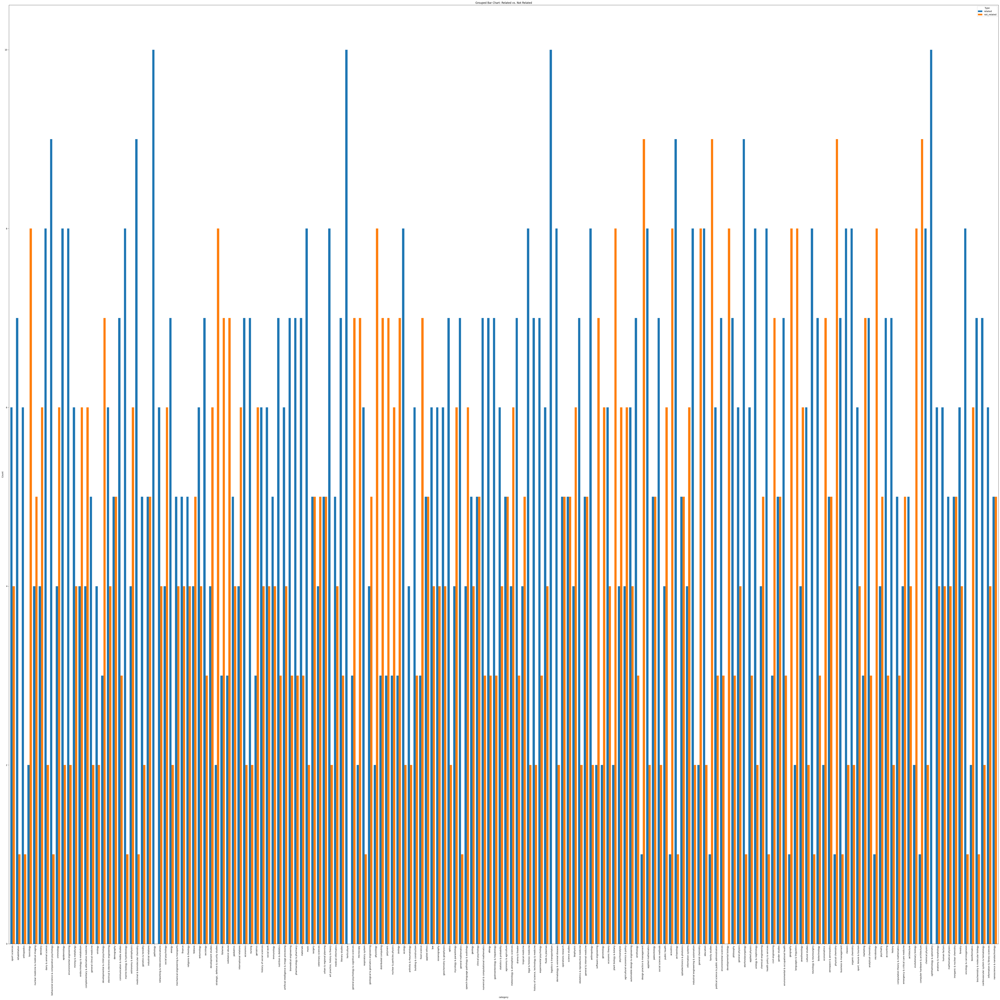

In [13]:
group_bar_chart(level_3_metrics)

Number of categories that are not related: 57


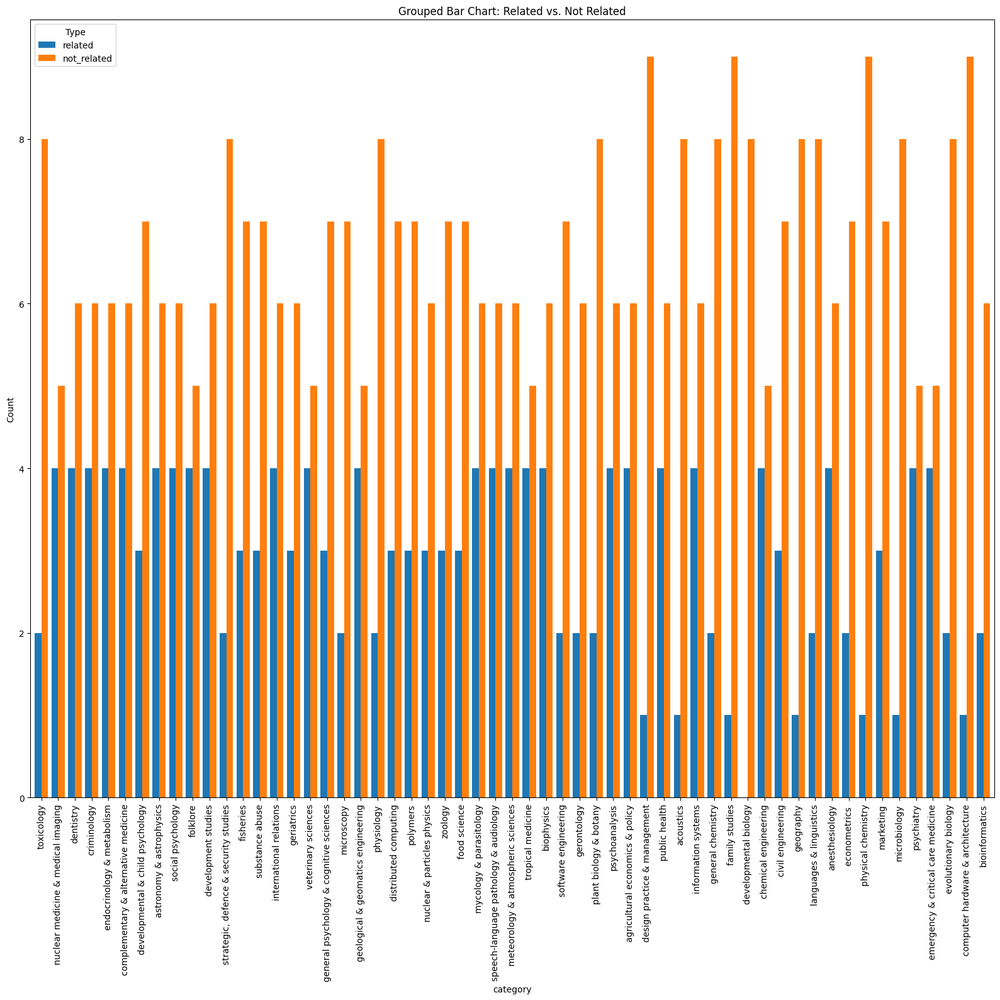

In [14]:
# only show the categories where the unrelated are more than the related
level_3_metrics_non = level_3_metrics[level_3_metrics["not_related"] > level_3_metrics["related"]]
# also print the number of categories that are not related
print(f"Number of categories that are not related: {len(level_3_metrics_non)}")
group_bar_chart(level_3_metrics_non, figsize=(16, 16))

Number of categories: 101


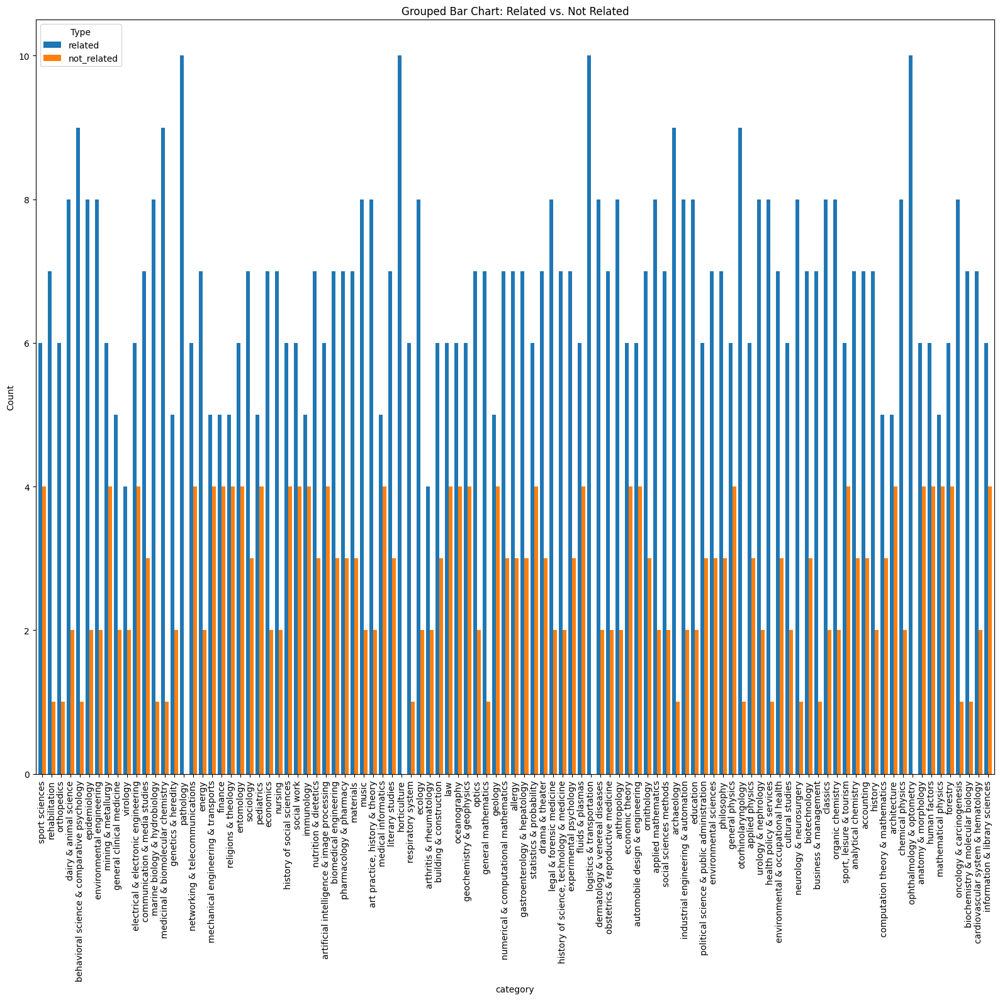

In [15]:
# only show the categories where the related are more than the unrelated
level_3_metrics_rel = level_3_metrics[level_3_metrics["related"] > level_3_metrics["not_related"]]
# also print the number of categories
print(f"Number of categories: {len(level_3_metrics_rel)}")
group_bar_chart(level_3_metrics_rel, figsize=(16, 16))

Number of categories: 16


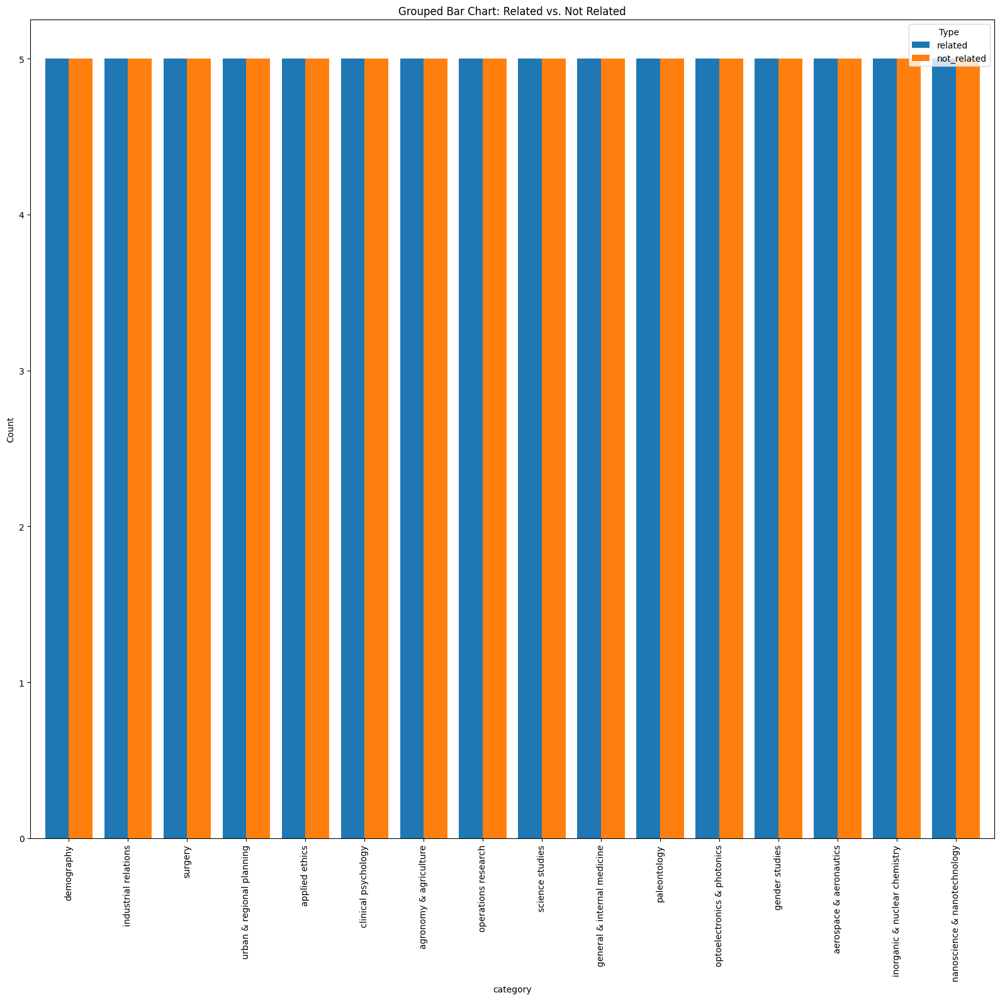

In [16]:
# only show the categories where the related are equal with the unrelated
level_3_metrics_eq = level_3_metrics[level_3_metrics["related"] == level_3_metrics["not_related"]]
# also print the number of categories
print(f"Number of categories: {len(level_3_metrics_eq)}")
group_bar_chart(level_3_metrics_eq, figsize=(16, 16))

### Evaluation with Citation data

A key thing to notice is that we only classify using citation data up to Level 4. The classifier does not take the text into consideration. As a result, in the top-predicted publications per Level 3 and 4, there exists publications that are missing their title or their abstract. Furthermore, the fact the the abstract is missing in some publications, might affect the LLM's performance in answering relevant/non-relevant. We will perform the experiment again but now also providing citation data. If the not-related publications diminish by a lot, that means that we should change the classification approach and take into account both the text and citation data in the levels up to L4.

In [17]:
# NOTE the first experiment/cell with the publications at Level 3 must be run first - because 
# we use the results from that experiment to run this one
# gather citation data for all the publications in the level_results dictionary
# use our doimode API to get the citation data.

# FOR THE LEVEL 3
level_3_results_cit_data, level_3_metrics_cit_data = run_experiment_citation_data(
    level_results=level_3_results,
    filename="eda-case-1-l3-cit-data-100125.json",
    score_key="score_for_L3"
)

                                    related  not_related  total_evaluated
sport sciences                            7            3               10
rehabilitation                            6            2                8
orthopedics                               7            0                7
toxicology                                4            6               10
nuclear medicine & medical imaging        7            2                9
...                                     ...          ...              ...
bioinformatics                            3            5                8
biochemistry & molecular biology          7            1                8
cardiovascular system & hematology        9            0                9
information & library sciences            6            4               10
nanoscience & nanotechnology              5            5               10

[174 rows x 3 columns]


#### Pie Chart

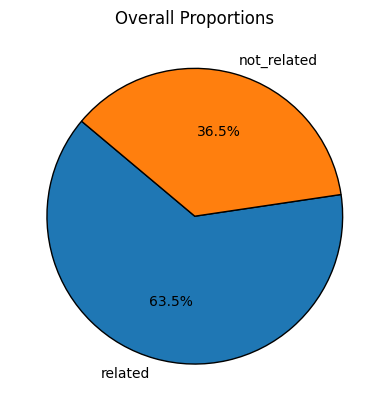

In [18]:
plot_pie_chart(level_3_metrics_cit_data)

#### Group Bar Charts

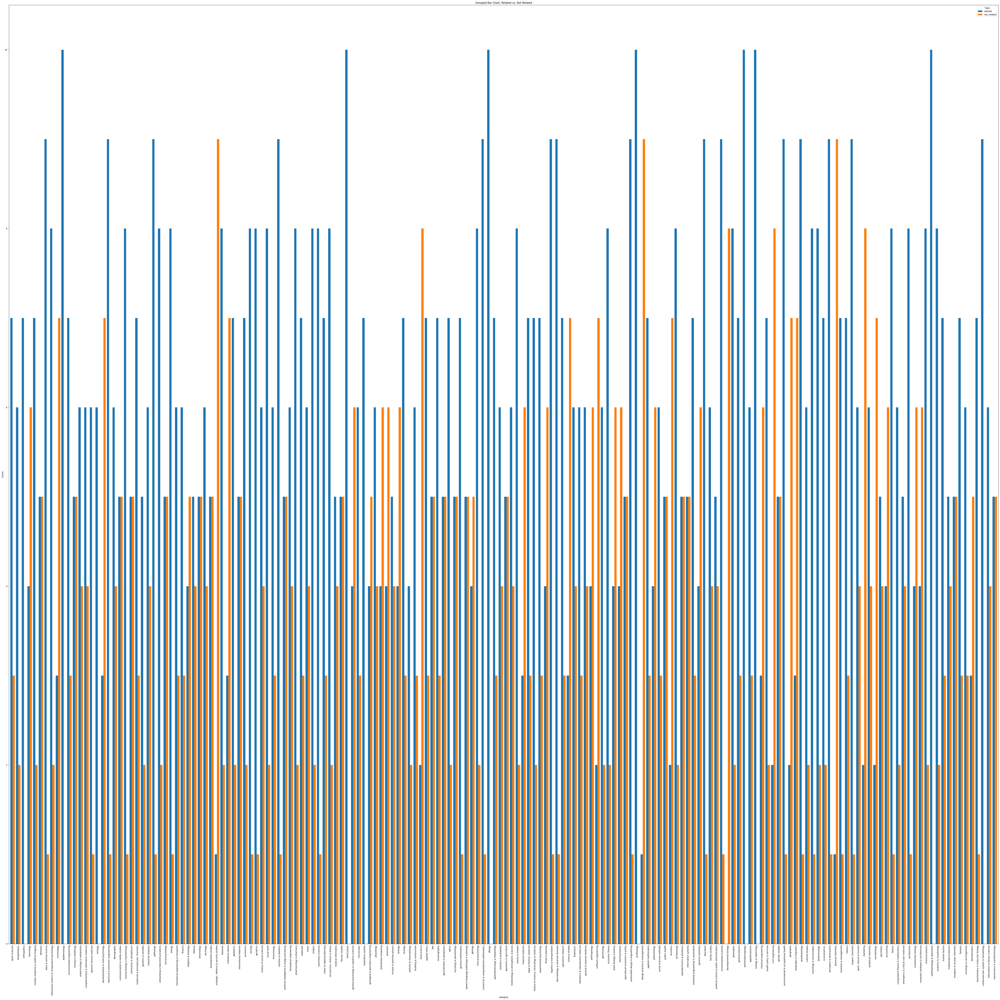

In [19]:
group_bar_chart(level_3_metrics_cit_data)

Number of categories that are not related when using citation data: 36


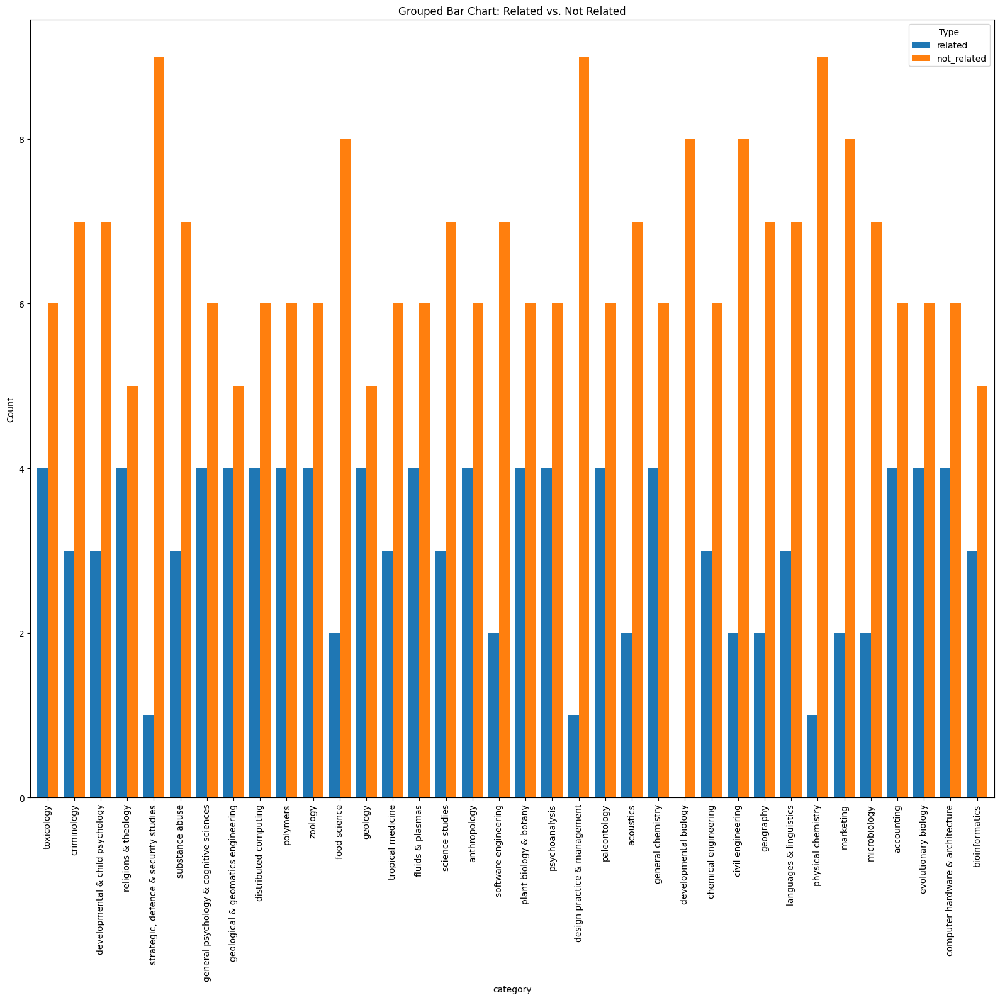

In [20]:
# only show the categories where the unrelated are more than the related
level_3_metrics_non_cit_data = level_3_metrics_cit_data[level_3_metrics_cit_data["not_related"] > level_3_metrics_cit_data["related"]]
# also print the number of categories that are not related
print(f"Number of categories that are not related when using citation data: {len(level_3_metrics_non_cit_data)}")
group_bar_chart(level_3_metrics_non_cit_data, figsize=(16, 16))

Number of categories related when using citation data: 116


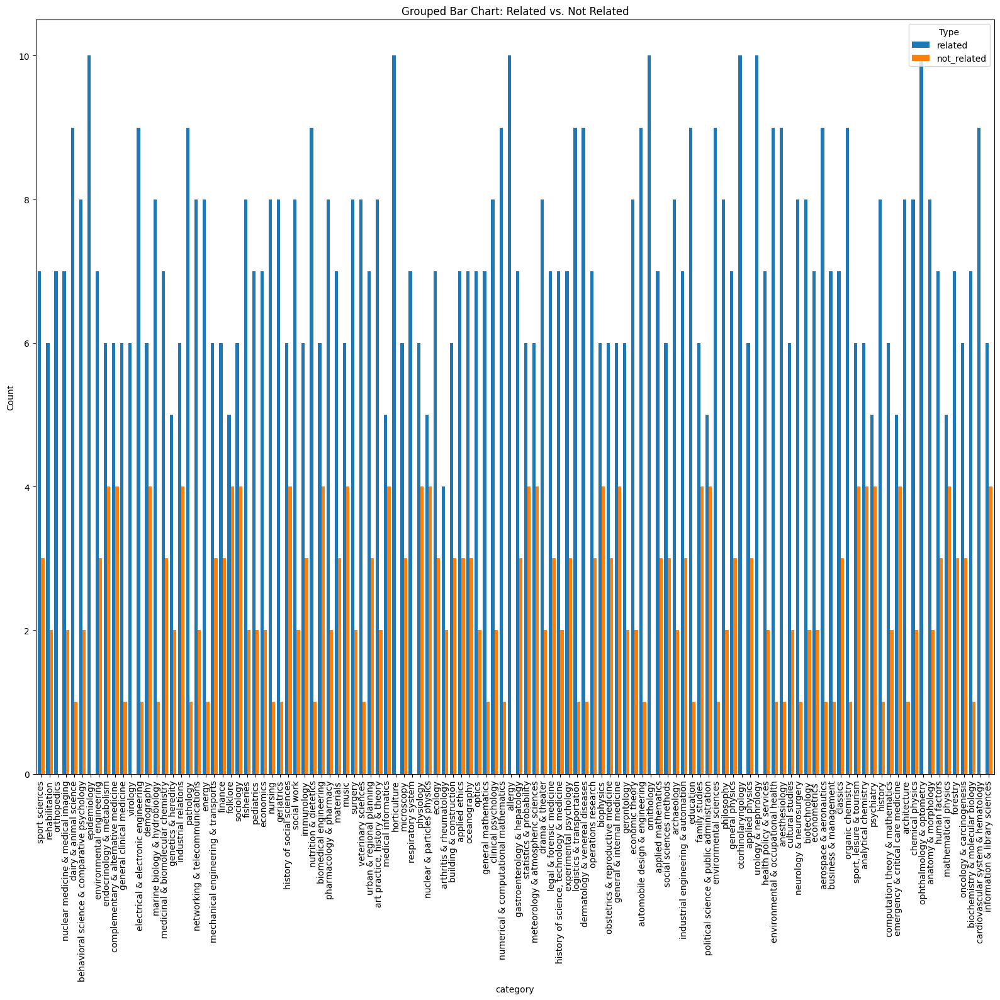

In [21]:
# only show the categories where the related are more than the unrelated
level_3_metrics_rel_cit_data = level_3_metrics_cit_data[level_3_metrics_cit_data["related"] > level_3_metrics_cit_data["not_related"]]
# also print the number of categories
print(f"Number of categories related when using citation data: {len(level_3_metrics_rel_cit_data)}")
group_bar_chart(level_3_metrics_rel_cit_data, figsize=(16, 16))

Number of categories with equal related/non-related when using citation data: 22


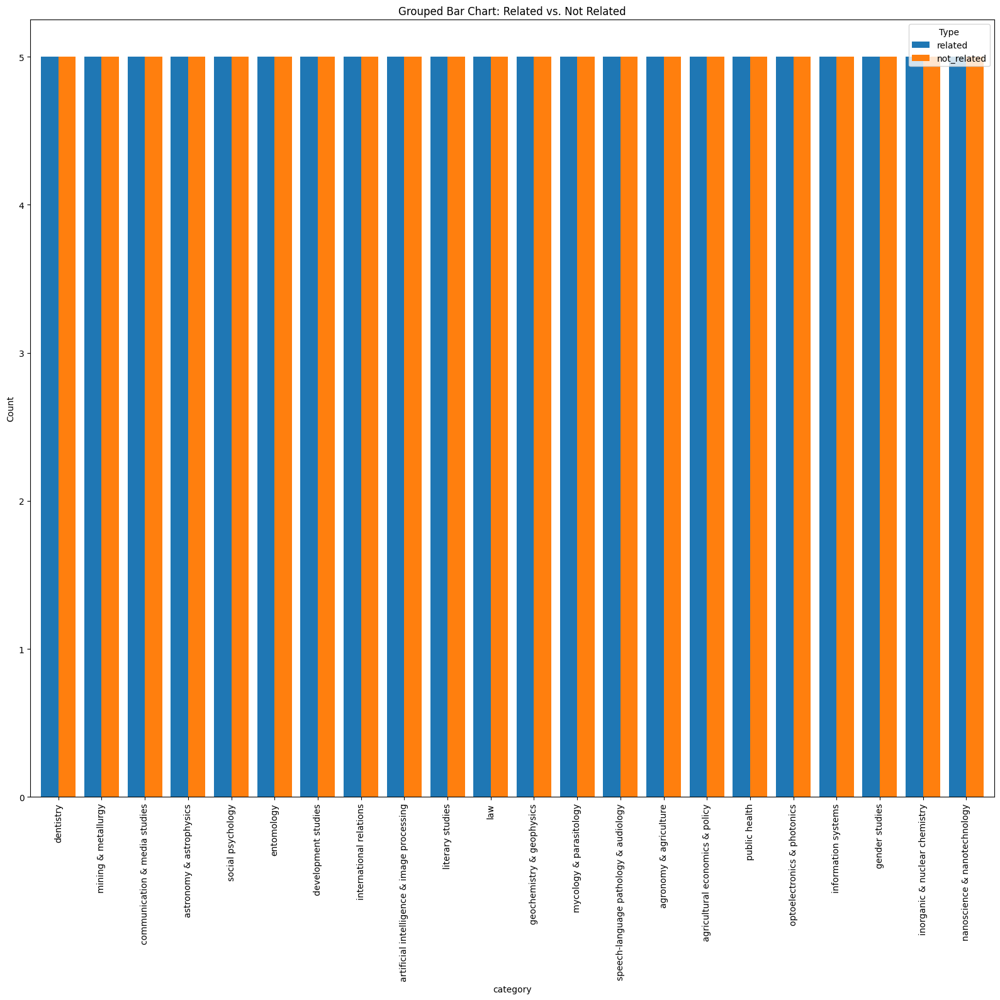

In [22]:
# only show the categories where the related are equal with the unrelated
level_3_metrics_eq_cit_data = level_3_metrics_cit_data[level_3_metrics_cit_data["related"] == level_3_metrics_cit_data["not_related"]]
# also print the number of categories
print(f"Number of categories with equal related/non-related when using citation data: {len(level_3_metrics_eq_cit_data)}")
group_bar_chart(level_3_metrics_eq_cit_data, figsize=(16, 16))

## Case 1 - Level 4 Experiments

### Evaluation without Citation Data

In [23]:
# FOR THE LEVEL 4
level_4_results, level_4_metrics = run_experiment_no_citation_data(
    level="level_4",
    filename="eda-case-1-l4-100125.json",
    science_descriptions=sci_desc_l3_l4,
    score_key="score_for_L4"
)

                                                    related  not_related  \
Logic and statistics/Mathematical and quantitat...        6            3   
Psychoactive drugs/Drug culture                           4            6   
Substance-related disorders/Substance dependence          0            9   
Statistical randomness                                    1            9   
Meat/Types of food                                        0           10   
...                                                     ...          ...   
Mechanical power control/Auto parts                       0           10   
Skin conditions resulting from physical factors           6            3   
Apis (genus)/Beekeeping                                   2            8   
Ligands/Chemical bonding                                  0           10   
Forensic disciplines/Forensic science                     7            3   

                                                    total_evaluated  
Logic and statist

#### Pie Chart

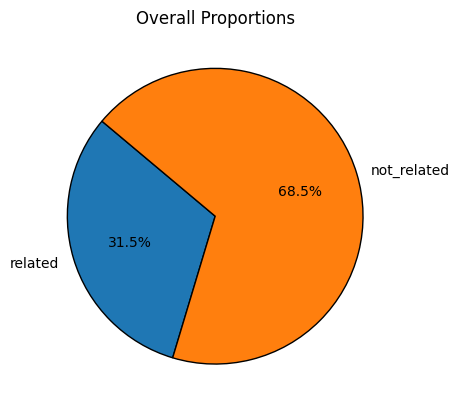

In [24]:
plot_pie_chart(level_4_metrics)

#### Group bar chart

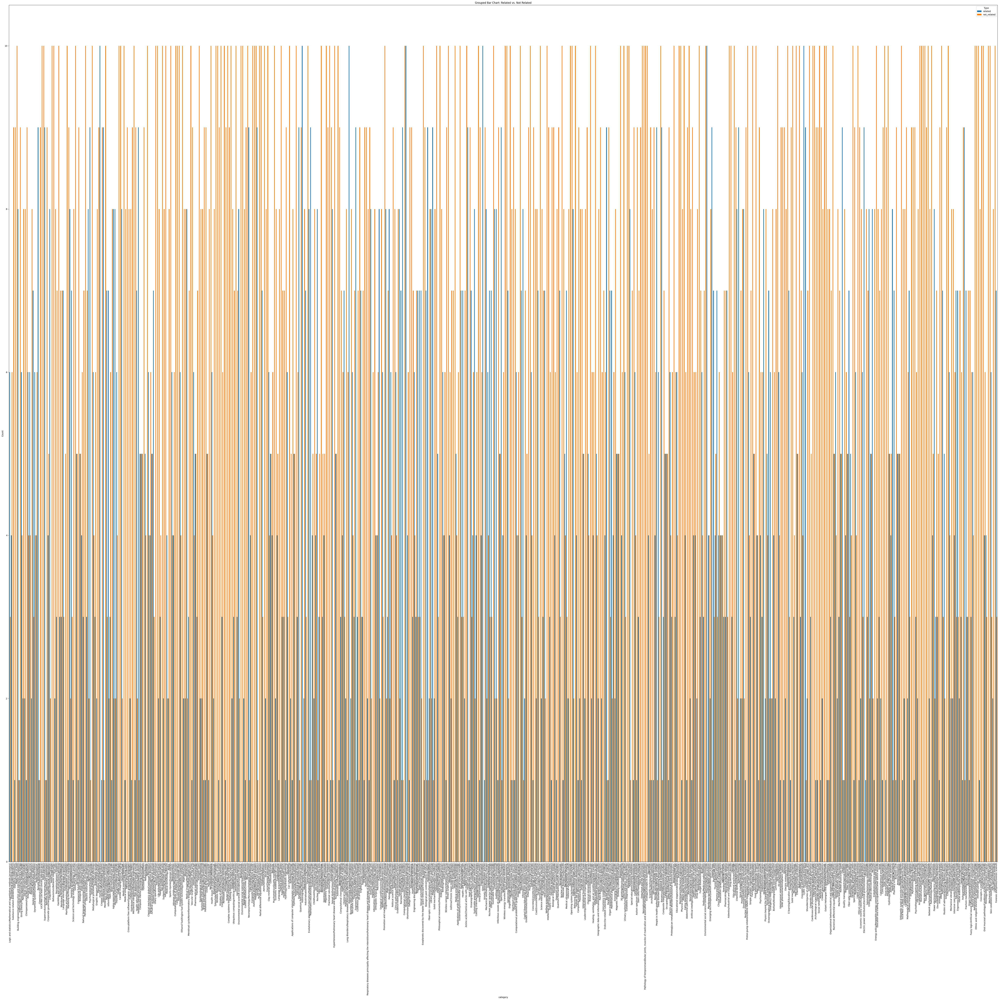

In [25]:
group_bar_chart(level_4_metrics)

Number of categories that are not related: 406


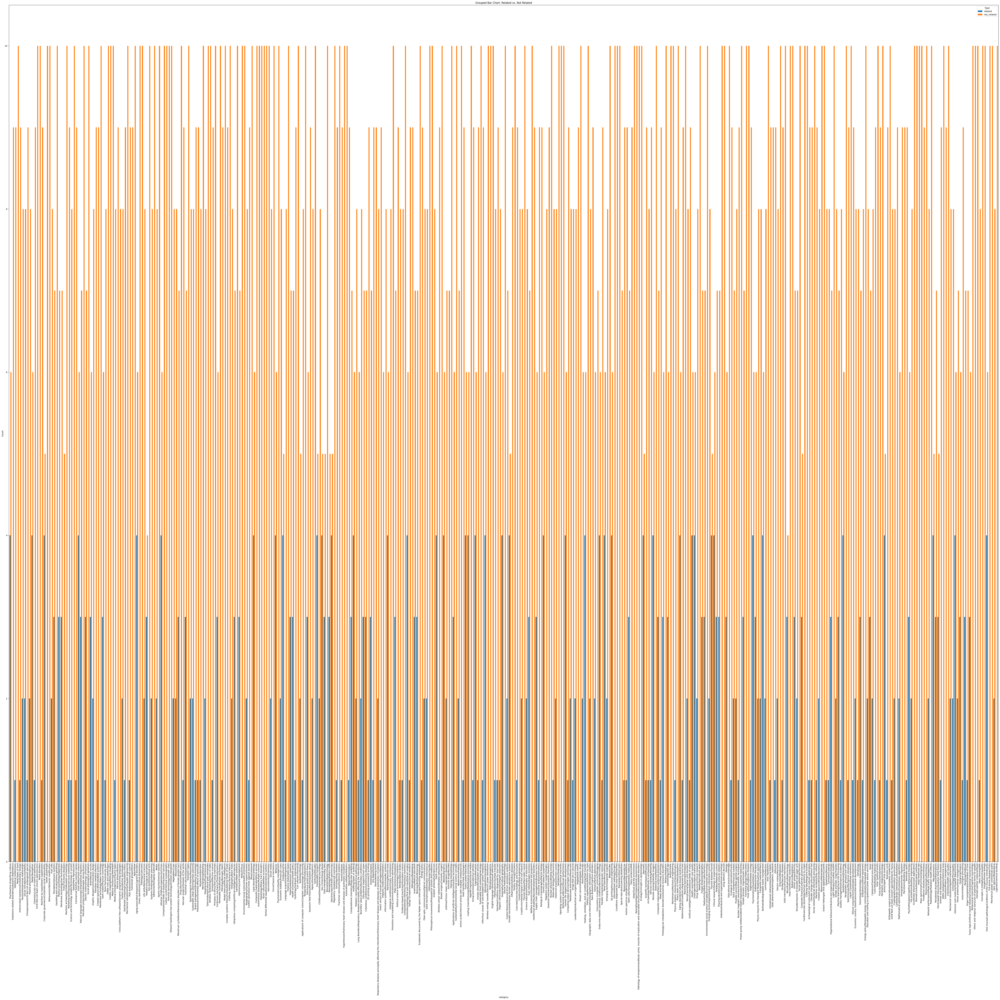

In [26]:
# only show the categories where the unrelated are more than the related
level_4_metrics_non = level_4_metrics[level_4_metrics["not_related"] > level_4_metrics["related"]]
# also print the number of categories that are not related
print(f"Number of categories that are not related: {len(level_4_metrics_non)}")
group_bar_chart(level_4_metrics_non, figsize=(64, 64))

Number of categories that are related: 155


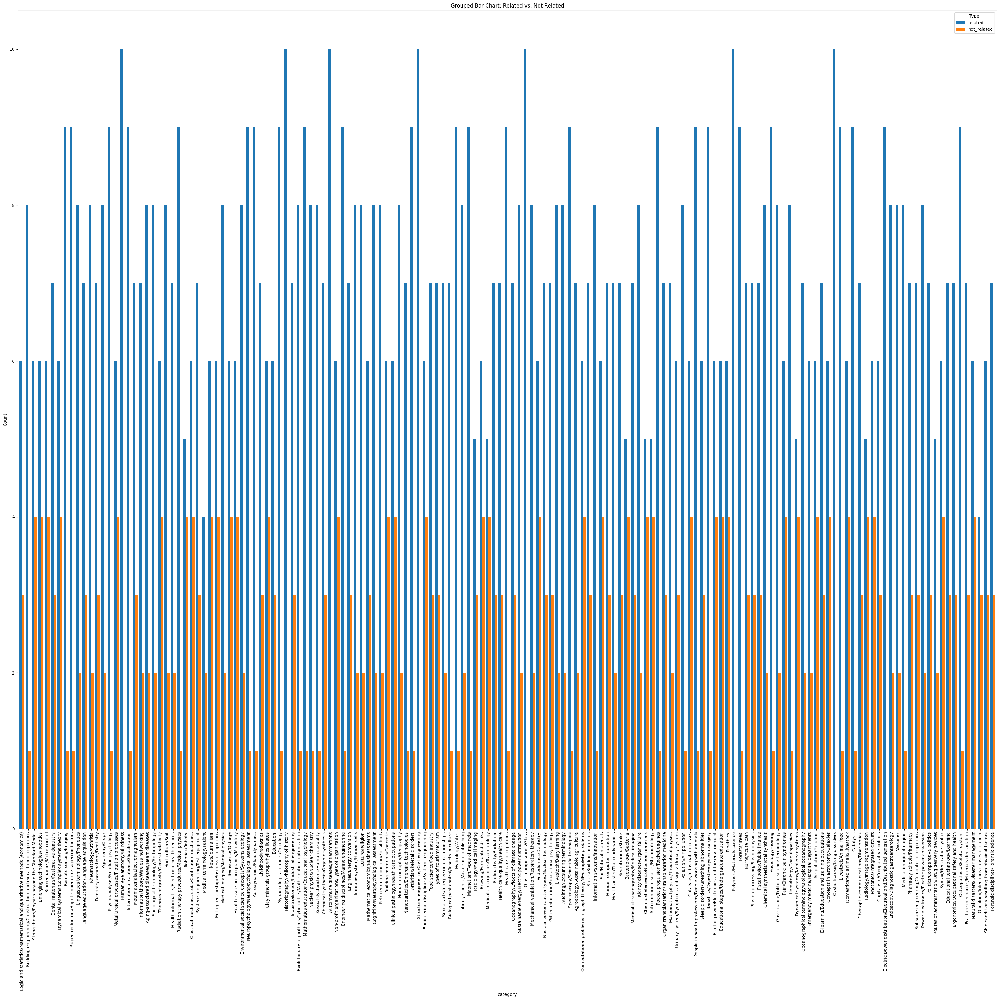

In [27]:
# only show the categories where the related are more than the unrelated
level_4_metrics_rel = level_4_metrics[level_4_metrics["related"] > level_4_metrics["not_related"]]
# also print the number of categories
print(f"Number of categories that are related: {len(level_4_metrics_rel)}")
group_bar_chart(level_4_metrics_rel, figsize=(32, 32))

Number of categories that are equal related/non-related: 30


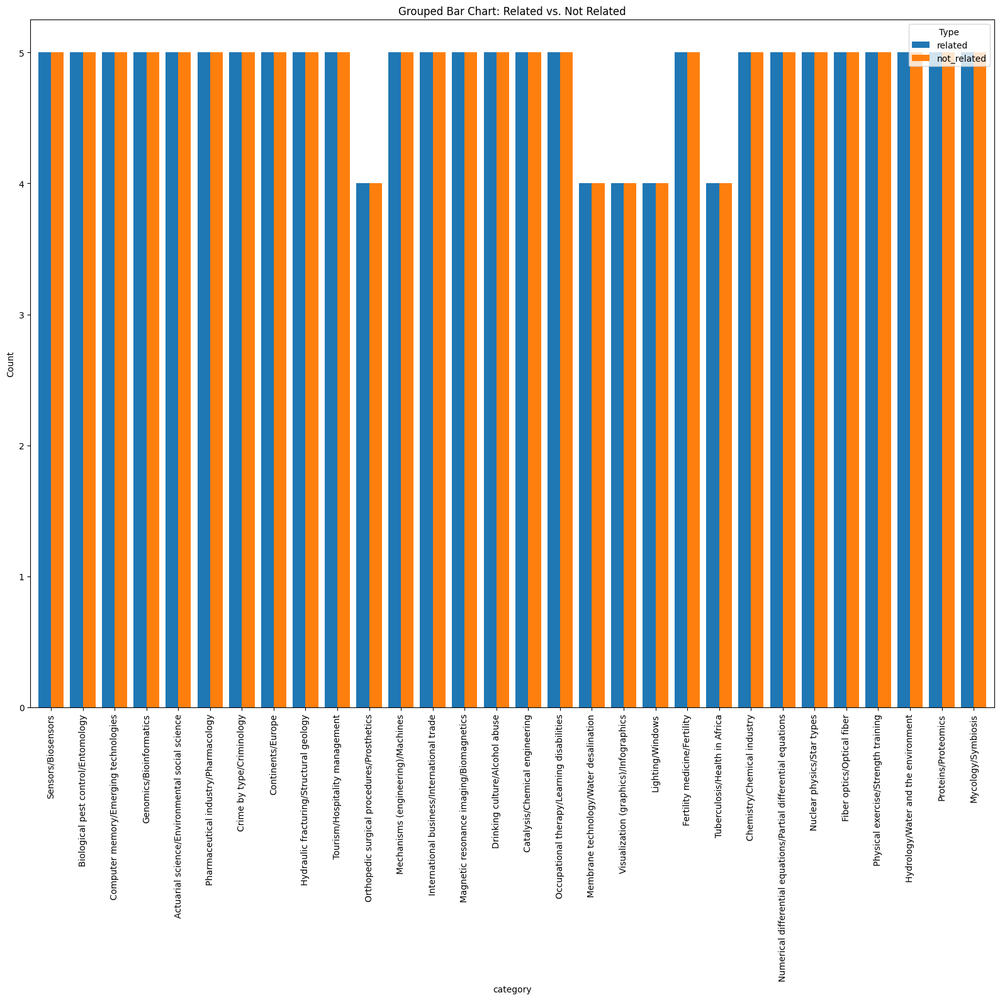

In [28]:
# only show the categories where the related are equal with the unrelated
level_4_metrics_eq = level_4_metrics[level_4_metrics["related"] == level_4_metrics["not_related"]]
# also print the number of categories
print(f"Number of categories that are equal related/non-related: {len(level_4_metrics_eq)}")
group_bar_chart(level_4_metrics_eq, figsize=(16, 16))

### Evaluation with Citation Data

In [29]:
# NOTE the first experiment/cell with the publications at Level 4 must be run first - because
# we use the results from that experiment to run this one
# gather citation data for all the publications in the level_results dictionary
# use our doimode API to get the citation data.

# FOR THE LEVEL 4
level_4_results_cit_data, level_4_metrics_cit_data = run_experiment_citation_data(
    level_results=level_4_results,
    filename="eda-case-1-l4-cit-data-100125.json",
    score_key="score_for_L4"
)

                                                    related  not_related  \
Logic and statistics/Mathematical and quantitat...        7            2   
Psychoactive drugs/Drug culture                           3            7   
Substance-related disorders/Substance dependence          0            9   
Statistical randomness                                    0           10   
Meat/Types of food                                        1            9   
...                                                     ...          ...   
Mechanical power control/Auto parts                       0           10   
Skin conditions resulting from physical factors           6            3   
Apis (genus)/Beekeeping                                   1            9   
Ligands/Chemical bonding                                  0           10   
Forensic disciplines/Forensic science                     7            3   

                                                    total_evaluated  
Logic and statist

#### Pie Chart

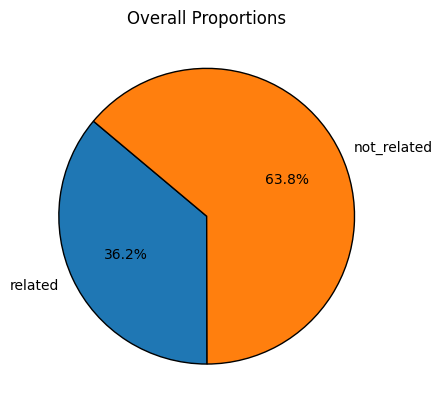

In [30]:
plot_pie_chart(level_4_metrics_cit_data)

#### Group bar chart

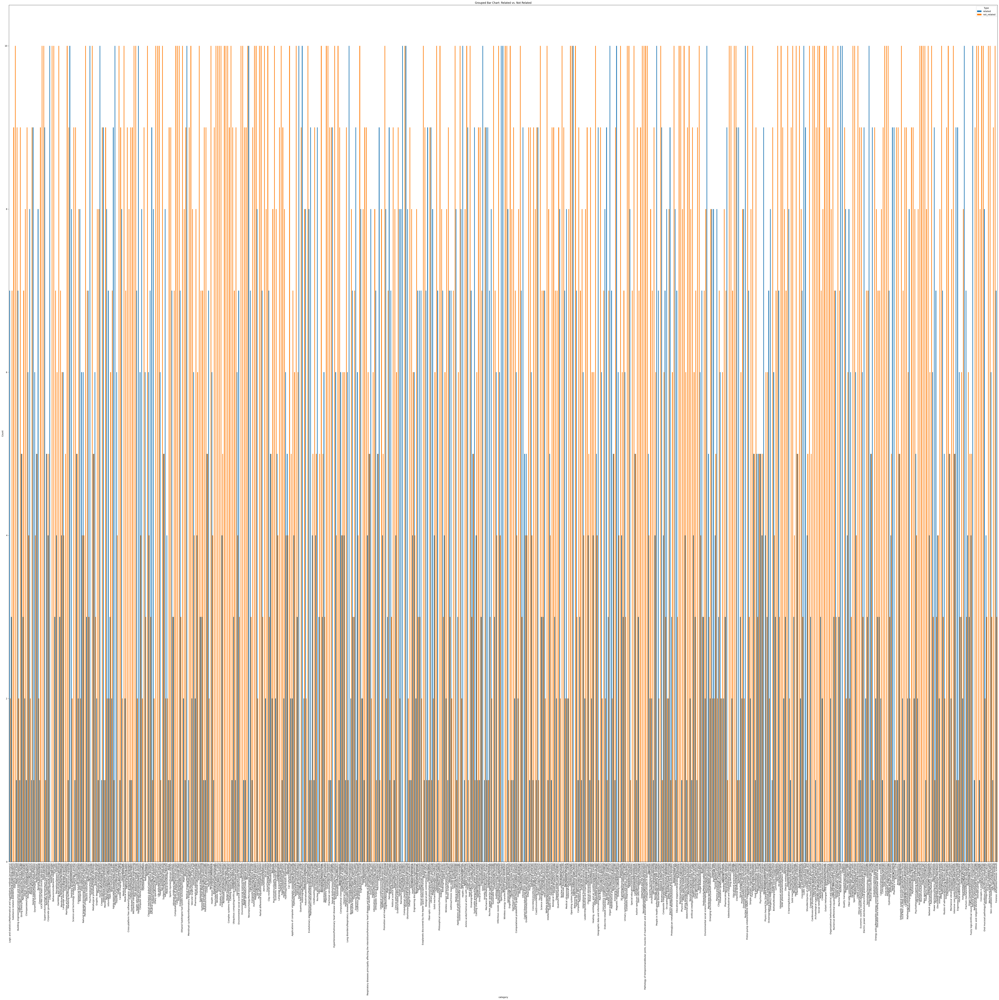

In [31]:
group_bar_chart(level_4_metrics_cit_data)

Number of categories that are not related when using citation data: 370


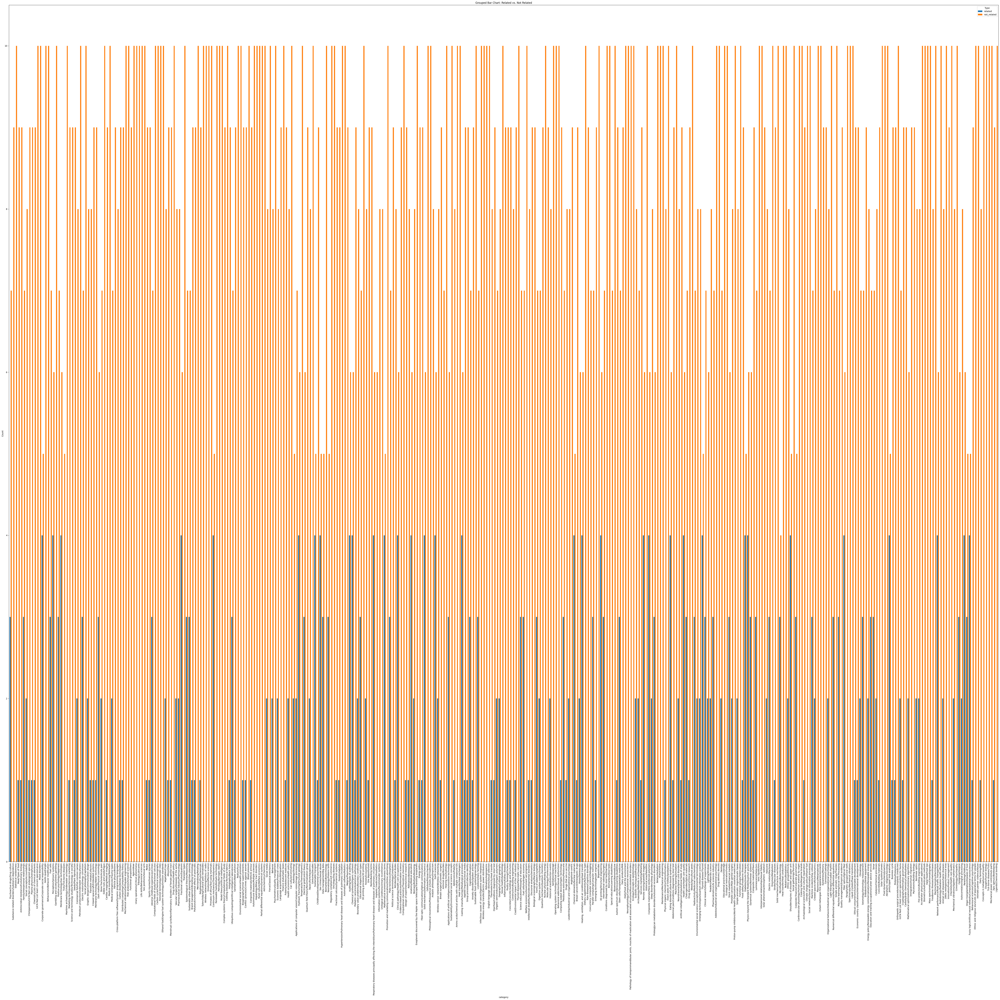

In [32]:
# only show the categories where the unrelated are more than the related
level_4_metrics_non_cit_data = level_4_metrics_cit_data[level_4_metrics_cit_data["not_related"] > level_4_metrics_cit_data["related"]]
# also print the number of categories that are not related
print(f"Number of categories that are not related when using citation data: {len(level_4_metrics_non_cit_data)}")
group_bar_chart(level_4_metrics_non_cit_data, figsize=(64, 64))

Number of categories related when using citation data: 199


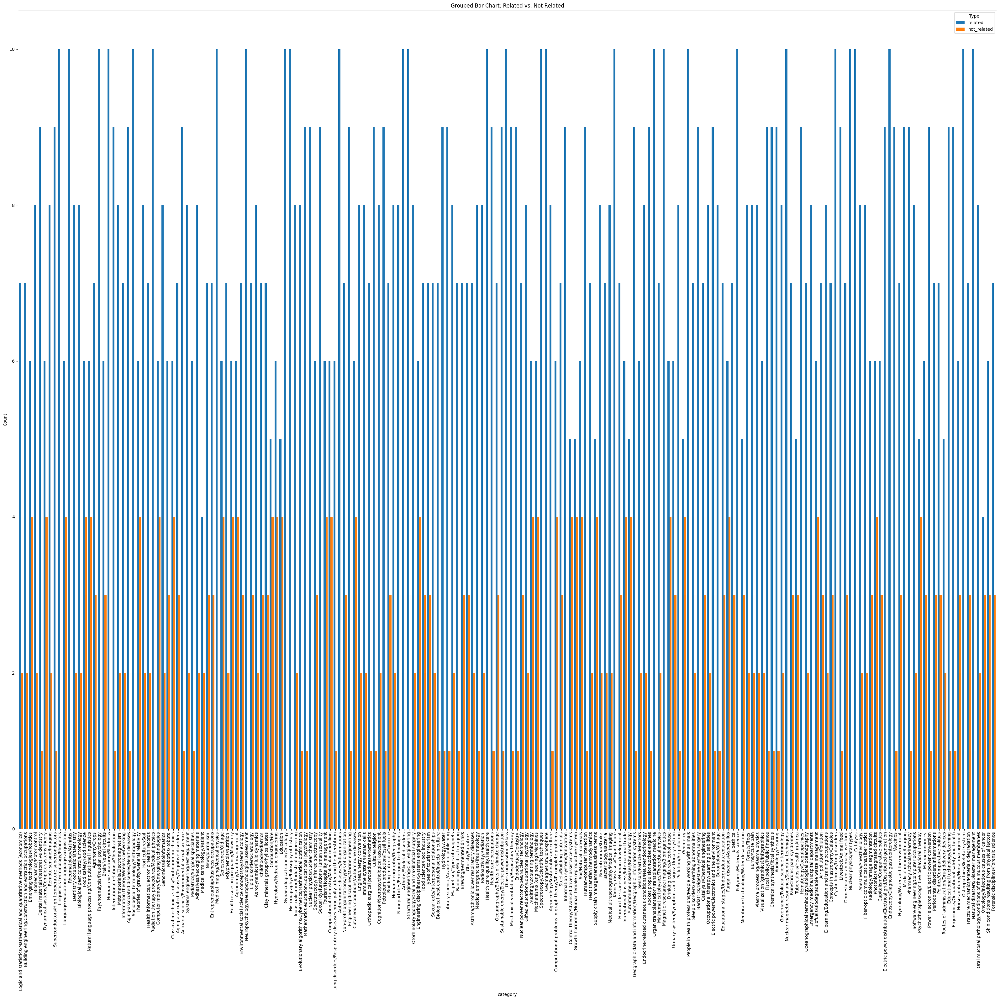

In [33]:
# only show the categories where the related are more than the unrelated
level_4_metrics_rel_cit_data = level_4_metrics_cit_data[level_4_metrics_cit_data["related"] > level_4_metrics_cit_data["not_related"]]
# also print the number of categories
print(f"Number of categories related when using citation data: {len(level_4_metrics_rel_cit_data)}")
group_bar_chart(level_4_metrics_rel_cit_data, figsize=(32, 32))

Number of categories with equal related/non-related when using citation data: 22


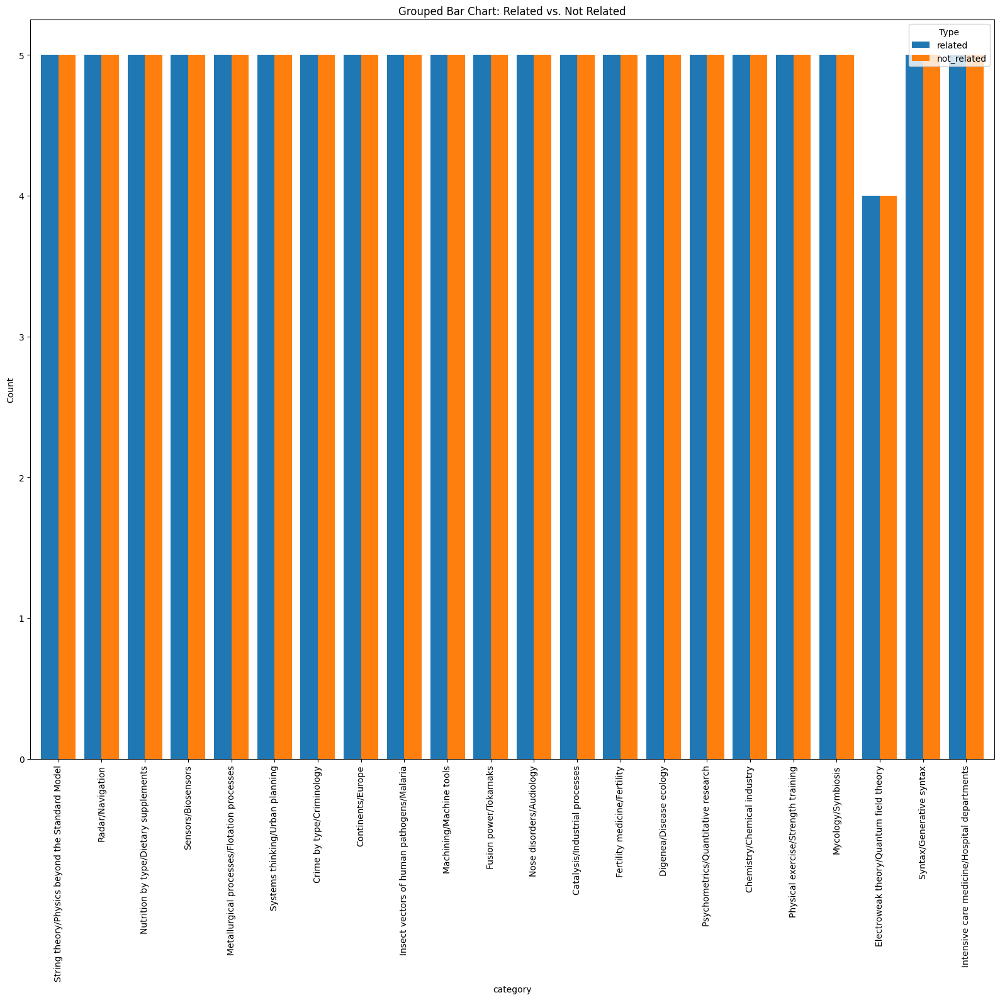

In [34]:
# only show the categories where the related are equal with the unrelated
level_4_metrics_eq_cit_data = level_4_metrics_cit_data[level_4_metrics_cit_data["related"] == level_4_metrics_cit_data["not_related"]]
# also print the number of categories
print(f"Number of categories with equal related/non-related when using citation data: {len(level_4_metrics_eq_cit_data)}")
group_bar_chart(level_4_metrics_eq_cit_data, figsize=(16, 16))

## Venue Graph exploration

### Problematic Field of Science
Given the above charts and results, we can identify FoS where the unrelated publications are more than the related. This means that there is a problem with the classification step and more specifically with the venue graph, since these publications have a very high classification score. We consider an FoS problematic when the unrelated publications are equal or more than the related. 

### Exploration Steps
- For each problematic FoS, identify the unrelated publications.
- For each unrelated publication, retrieve (using our Doimode REST API), the publication, reference and citation venues.
- Create a dataframe, where each row is a publication. The columns will be: DOI, TITLE, ABSTRACT, LEVEL_#, PUB_VENUE, CIT_VENUES, REF_VENUES, CL_SCORE, RELATED, UN_RELATED
- Create a dataframe, where each row is a venue. The columns will be: VENUE_NAME, EDGE_SCORE, CONNECTED_L#, UNRELATED_L3#. Some venues might be connected to multiple L#. We will have multiple rows per venue.


In [35]:
# general function calls & inits for exploring the venue graph
download_venue_graph()
# init the graph using the Multigraph class in utils
venue_graph = MultiGraph(os.path.join(DATA_PATH, 'scinobo_inference_graph.json'))
# init the venue parser
venue_parser = VenueParser(abbreviation_dict=os.path.join(DATA_PATH, 'misc', 'venues_maps.p'))

--2025-01-31 10:27:03--  https://huggingface.co/datasets/iNoBo/scinobo-fos-inference-graph/resolve/main/scinobo_inference_graph.json?download=true
Resolving huggingface.co (huggingface.co)... 3.160.150.2, 3.160.150.7, 3.160.150.119, ...
Connecting to huggingface.co (huggingface.co)|3.160.150.2|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/cb/64/cb64422ac082911ed3d568b52946749e7aee37386a390fe06cfed7579c418668/cc7104df61dd70547c6944612497c54b1bc1cf7ebdacede46a3262fb98e2ec01?response-content-disposition=attachment%3B+filename*%3DUTF-8%27%27scinobo_inference_graph.json%3B+filename%3D%22scinobo_inference_graph.json%22%3B&response-content-type=application%2Fjson&Expires=1738322824&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTczODMyMjgyNH19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmhmLmNvL3JlcG9zL2NiLzY0L2NiNjQ0MjJhYzA4MjkxMWVkM2Q1NjhiNTI5NDY3NDllN2FlZTM3Mzg2YTM5MGZlMDZjZmVkNzU3OWM

### Venue Graph Exploration - Level 3

In [36]:
# in level_#_results_cit_data, we have all the metadata that we need. We can create the two above mentioned dataframes.
# publication dataframe
venue_graph_exploration_publications_df(
    level_3_results_cit_data,
    score_key="score_for_L3",
    filename="eda-case-1-l3-publications-100125.xlsx"
)

In [37]:
# extract the information per venue, to create the second dataframe for the venue exploration.
# Create a dataframe, where each row is a venue. The columns will be: VENUE_NAME, EDGE_SCORE, CONNECTED_L#, UNRELATED, RELATED
# Some venues might be connected to multiple L#. We will have multiple rows per venue.
venue_graph_exploration_venues_df(
    parser=venue_parser,
    graph=venue_graph,
    input_data=level_3_results_cit_data,
    filename="eda-case-1-l3-venues-100125.xlsx",
    level_key="in_L3"
)

Extracting venue information:   0%|          | 0/174 [00:00<?, ?it/s]

Extracting venue information: 100%|██████████| 174/174 [00:01<00:00, 154.86it/s]


### Venue Graph Exploration - Level 4

In [38]:
# in level_#_results_cit_data, we have all the metadata that we need. We can create the two above mentioned dataframes.
# publication dataframe
venue_graph_exploration_publications_df(
    level_4_results_cit_data,
    score_key="score_for_L4",
    filename="eda-case-1-l4-publications-100125.xlsx"
)

In [39]:
# extract the information per venue, to create the second dataframe for the venue exploration.
# Create a dataframe, where each row is a venue. The columns will be: VENUE_NAME, EDGE_SCORE, CONNECTED_L#, UNRELATED, RELATED
# Some venues might be connected to multiple L#. We will have multiple rows per venue.
venue_graph_exploration_venues_df(
    parser=venue_parser,
    graph=venue_graph,
    input_data=level_4_results_cit_data,
    filename="eda-case-1-l4-venues-100125.xlsx",
    level_key="in_L4"
)

Extracting venue information: 100%|██████████| 591/591 [00:03<00:00, 181.54it/s]


# Case 2:

## Statistics on related/not-related & subcategory/not-subcategory

The results of the **validate.py script under the pipeline folder are logged into Langfuse**. Based on the results logged, we can calculate some statistics. We have the following candidate results for each pair (L3-L4 and L4-L5) logged into Langfuse:
-    Related: True | Subcategory: True
-    Related: True | Subcategory: False
-    Related: False | Subcategory: False
        
In essence, our task is to fill the missing values in the two following tables:

Table 1: Pairs    
| Case   | Related | Subcategory | Statistics |
|--------|---------|-------------|------------|
| L3-L4  | T       | T           |    TBF     |
| L3-L4  | T       | F           |    TBF     |
| L3-L4  | F       | F           |    TBF     |
|--------|---------|-------------|------------|
| L4-L5  | T       | T           |    TBF     |
| L4-L5  | T       | F           |    TBF     |
| L4-L5  | F       | F           |    TBF     |
|--------|---------|-------------|------------|

<hr style="width:50%;text-align:left;margin-left:0">
<hr style="width:50%;text-align:left;margin-left:0">

Table 2: Triples
| Case   | L3-L4 Related | L3-L4 Subcategory | L4-L5 Related | L4-L5 Subcategory | Statistics |
|--------|---------------|-------------------|---------------|-------------------|------------|
| Case 1 | T             | T                 | T             | T                 | TBF        |
| Case 2 | T             | T                 | T             | F                 | TBF        |
| Case 3 | T             | T                 | F             | F                 | TBF        |
| Case 4 | T             | F                 | T             | T                 | TBF        |
| Case 5 | T             | F                 | T             | F                 | TBF        |
| Case 6 | T             | F                 | F             | F                 | TBF        |
| Case 7 | F             | F                 | T             | T                 | TBF        |
| Case 8 | F             | F                 | T             | F                 | TBF        |
| Case 9 | F             | F                 | F             | F                 | TBF        |



## Case 2: Util functions & Declarations

In [40]:
def collect_traces(my_langfuse, limit=50, page=1, tags=None):
    all_traces = []
    while True:
        traces = trace_pagination(my_langfuse, LANGFUSE_URER_ID_VAR, limit, page, tags=tags)
        if len(traces.data) < limit:
            # we are at the last page
            all_traces.extend(traces.data)
            break
        all_traces.extend(traces.data)
        page += 1
    if tags is None:
        # filter out the traces that are tagged
        all_traces = [trace for trace in all_traces if not trace.tags] 
    return all_traces


def calc_statistics_table_1(my_langfuse, my_traces, cases_to_calc):
    # calculate the statistics
    statistics = {case: 0 for case in cases_to_calc}
    for trace in tqdm(my_traces, desc=f"Calculating statistics for {len(my_traces)} traces"):
        observation = my_langfuse.fetch_observation(trace.observations[0]) # each trace has only one observation
        output = observation.data.output
        related, subcategory = output["related"], output["subcategory"] # these are boolean values
        statistics[f"{str(int(related))}{str(int(subcategory))}"] += 1
    return statistics


def calc_statistics_table_2(cases_to_calc, l3_l4_dict, l4_l5_dict):
    triples_taxonomy = list(set([tuple([item['level_3'], item['level_4'], item['level_5_name'], item['level_5_id']]) for item in fos_taxonomy if item['level_5_name'] != "N/A"]))
    dups_added = dict()
    # calculate the statistics
    statistics = {case: 0 for case in cases_to_calc}
    for tup in triples_taxonomy:
        l3, l4, l5, _ = tup
        if l5 not in l4_l5_dict:
            continue
        cand_l3s = l3_l4_dict[l4]
        cand_l3s = [cand_l3 for cand_l3 in cand_l3s if cand_l3['parent'] == l3] # this is always one item
        if len(cand_l3s) > 1:
            raise ValueError("Unexpected error, more than one l3 found as candidates")
        cand_l4s = l4_l5_dict[l5]
        cand_l4s = [cand_l4 for cand_l4 in cand_l4s if cand_l4['parent'] == l4] # this is not always one item
        # the issue with langfuse occurs because we have duplicate l4s for the same l5
        # Some l4s clusters got the same name, while naming. 
        # These duplicate (l4, l5) might have different results in related/subcategory
        # because it is a different cluster with different publications. 
        # later on we could possibly drop the duplicate with the lowest number of publications or 
        # with False in related/subcategory. For now add them all just once.
        for cand_l4 in cand_l4s:
            to_add = (
                cand_l3s[0]['parent'],
                cand_l4['parent'],
                l5,
                cand_l3s[0]['related'],
                cand_l3s[0]['subcategory'],
                cand_l4['related'],
                cand_l4['subcategory']
            )
            if to_add not in dups_added:
                statistics[f"{str(int(cand_l3s[0]['related']))}{str(int(cand_l3s[0]['subcategory']))}{str(int(cand_l4['related']))}{str(int(cand_l4['subcategory']))}"] += 1
                dups_added[to_add] = 1
            else:
                # add it only if the number of times is lower than the number of dup L4s
                if dups_added[to_add] < len(cand_l4s):
                    dups_added[to_add] += 1
                    statistics[f"{str(int(cand_l3s[0]['related']))}{str(int(cand_l3s[0]['subcategory']))}{str(int(cand_l4['related']))}{str(int(cand_l4['subcategory']))}"] += 1
    return statistics


def transform_traces(my_langfuse, my_traces):
    level_dict = dict()
    for trace in my_traces:
        observation = my_langfuse.fetch_observation(trace.observations[0])
        related, subcategory = observation.data.output["related"], observation.data.output["subcategory"]
        if trace.metadata["child"] not in level_dict:
            level_dict[trace.metadata["child"]] = []
        level_dict[trace.metadata["child"]].append({
            "parent": trace.metadata["parent"],
            "related": related,
            "subcategory": subcategory
        })
    return level_dict
    
    
def transform_df(df):
    transformed_data = []
    for case in df.index:
        for col in df.columns:
            if len(df.columns) == 3:
                related = 'T' if col[0] == '1' else 'F'
                subcategory = 'T' if col[1] == '1' else 'F'
                statistics = df.loc[case, col]
                transformed_data.append([case, related, subcategory, statistics])
            else:
                related = 'T' if col[0] == '1' else 'F'
                subcategory = 'T' if col[1] == '1' else 'F'
                related_2 = 'T' if col[2] == '1' else 'F'
                subcategory_2 = 'T' if col[3] == '1' else 'F'
                statistics = df.loc[case, col]
                transformed_data.append([case, related, subcategory, related_2, subcategory_2, statistics])
    return transformed_data

## Table 1: Pairs

In [41]:
# we have langfuse already set-up
# for pairs, we must retrieve the experiments with l3-l4 and the ones with l4-l5 (this experiment also has a tag: l4-l5-validation)
all_traces_l3_l4 = collect_traces(
    my_langfuse=langfuse,
    limit=50,
    page=1,
    tags=None
)
all_traces_l4_l5 = collect_traces(
    my_langfuse=langfuse,
    limit=50,
    page=1,
    tags=LANGFUSE_TAG_VAR
)

In [42]:
# based on the table 1 description, for each traces set, we have some cases to calculate
# for example for l3-l4 we have:
# Related: 1, Not Related: 0 --> 10
# Related: 0, Not Related: 0 --> 00
# Related: 1, Not Related: 1 --> 11
res_l3_l4 = calc_statistics_table_1(
    my_langfuse=langfuse,
    my_traces=all_traces_l3_l4,
    cases_to_calc=[
        "10",
        "00",
        "11"
    ]
)
res_l4_l5 = calc_statistics_table_1(
    my_langfuse=langfuse,
    my_traces=all_traces_l4_l5,
    cases_to_calc=[
        "10",
        "00",
        "11"
    ]
)
# create a dataframe similar to Table 1
df_table_1 = pd.DataFrame([res_l3_l4, res_l4_l5], index=["L3-L4", "L4-L5"])
df_table_1 = pd.DataFrame(transform_df(df_table_1), columns=['Case', 'Related', 'Subcategory', 'Statistics'])
df_table_1.to_excel(os.path.join(DATA_PATH, "metrics", "case-2-table-1-100125.xlsx"))
print(df_table_1)

Calculating statistics for 16328 traces: 100%|██████████| 16328/16328 [03:28<00:00, 78.50it/s]

    Case Related Subcategory  Statistics
0  L3-L4       T           F         298
1  L3-L4       F           F          18
2  L3-L4       T           T         291
3  L4-L5       T           F        9582
4  L4-L5       F           F         638
5  L4-L5       T           T        6108


## Table 2: Triples



In [43]:
# transform all_traces into two dicts. One has as keys the Level 3s and as values the Level 4s traces
# the second one has the Level 4s as keys and the Level 5s as values
case_2_l3_dict = transform_traces(my_traces=all_traces_l3_l4, my_langfuse=langfuse)
case_2_l4_dict = transform_traces(my_traces=all_traces_l4_l5, my_langfuse=langfuse)

In [44]:
# CASES FROM TABLE 2:
# CASE 1: 1111
# CASE 2: 1110
# CASE 3: 1100
# CASE 4: 1011
# CASE 5: 1010
# CASE 6: 1000
# CASE 7: 0011
# CASE 8: 0010
# CASE 9: 0000
res_table_2 = calc_statistics_table_2(
    cases_to_calc=[
        "1111",
        "1110",
        "1100",
        "1011",
        "1010",
        "1000",
        "0011",
        "0010",
        "0000"
    ],
    l3_l4_dict=case_2_l3_dict,
    l4_l5_dict=case_2_l4_dict
)

In [45]:
df_table_2 = pd.DataFrame(res_table_2, index=[
    "CASE"
])
df_table_2 = pd.DataFrame(transform_df(df_table_2), columns=['Case', "L3-L4 Related", "L3-L4 Subcategory",  "L4-L5 Related", "L4-L5 Subcategory", 'Statistics'])
df_table_2.to_excel(os.path.join(DATA_PATH, "metrics", "case-2-table-2-100125.xlsx"))
print(df_table_2)

   Case L3-L4 Related L3-L4 Subcategory L4-L5 Related L4-L5 Subcategory  \
0  CASE             T                 T             T                 T   
1  CASE             T                 T             T                 F   
2  CASE             T                 T             F                 F   
3  CASE             T                 F             T                 T   
4  CASE             T                 F             T                 F   
5  CASE             T                 F             F                 F   
6  CASE             F                 F             T                 T   
7  CASE             F                 F             T                 F   
8  CASE             F                 F             F                 F   

   Statistics  
0        4120  
1        5380  
2         215  
3        2031  
4        4169  
5         400  
6          36  
7         104  
8          33  
